## Importing the libraries

- Adapted from: https://www.tensorflow.org/beta/tutorials/generative/deepdream

In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
tf.__version__

'2.9.2'

## Loading the pre-built convolutional neural network

- InceptionNet: https://www.tensorflow.org/api_docs/python/tf/keras/applications/inception_v3
- Original paper: https://www.cv-foundation.org/openaccess/content_cvpr_2016/papers/Szegedy_Rethinking_the_Inception_CVPR_2016_paper.pdf
- Imagenet: http://www.image-net.org/

In [2]:
base_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')

87910968/87910968 [==============================] - 5s 0us/step


In [3]:
base_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   864         ['input_1[0][0]']                
                                32)                                                               
                                                                                                  
 batch_normalization (BatchNorm  (None, None, None,   96         ['conv2d[0][0]']                 
 alization)                     32)                                                    

In [4]:
len(base_model.layers)

311

In [5]:
# Relu
#names = ['mixed3', 'mixed5', 'mixed8', 'mixed9']
names = ['mixed3', 'mixed5']

In [6]:
base_model.input

<KerasTensor: shape=(None, None, None, 3) dtype=float32 (created by layer 'input_1')>

In [7]:
layers = [base_model.get_layer(name).output for name in names]

In [8]:
layers

[<KerasTensor: shape=(None, None, None, 768) dtype=float32 (created by layer 'mixed3')>,
 <KerasTensor: shape=(None, None, None, 768) dtype=float32 (created by layer 'mixed5')>]

In [9]:
deep_dream_model = tf.keras.Model(inputs = base_model.input, outputs = layers)

## Loading and pre-processing the image

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [12]:
image = tf.keras.preprocessing.image.load_img('/content/istockphoto-1306358815-612x612.jpg',
                                              target_size=(225, 375))

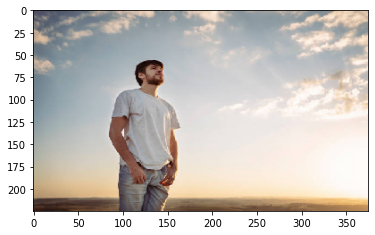

In [13]:
plt.imshow(image);

In [14]:
type(image)

PIL.Image.Image

In [15]:
image.size

(375, 225)

In [16]:
image.mode, len(image.mode)

('RGB', 3)

In [17]:
list(image.getdata())

[(79, 80, 100),
 (79, 80, 100),
 (80, 81, 101),
 (81, 82, 102),
 (82, 83, 103),
 (84, 86, 101),
 (86, 88, 103),
 (90, 92, 107),
 (91, 93, 108),
 (93, 95, 110),
 (89, 90, 110),
 (89, 90, 110),
 (88, 89, 109),
 (82, 83, 103),
 (80, 81, 101),
 (80, 85, 105),
 (82, 87, 107),
 (77, 82, 102),
 (79, 84, 104),
 (82, 87, 107),
 (78, 83, 102),
 (82, 87, 106),
 (83, 88, 107),
 (82, 87, 106),
 (81, 86, 105),
 (82, 89, 107),
 (81, 88, 107),
 (81, 87, 109),
 (80, 86, 110),
 (80, 87, 106),
 (80, 87, 106),
 (81, 88, 107),
 (82, 89, 108),
 (82, 89, 108),
 (80, 88, 107),
 (80, 88, 107),
 (81, 89, 108),
 (82, 90, 109),
 (82, 90, 109),
 (85, 93, 112),
 (86, 94, 113),
 (86, 94, 113),
 (87, 95, 114),
 (87, 95, 114),
 (90, 98, 117),
 (88, 96, 115),
 (89, 97, 116),
 (94, 102, 121),
 (101, 109, 128),
 (105, 114, 129),
 (105, 115, 127),
 (107, 117, 126),
 (107, 117, 126),
 (108, 119, 125),
 (107, 116, 131),
 (100, 109, 124),
 (98, 107, 122),
 (100, 109, 124),
 (106, 115, 130),
 (104, 114, 126),
 (104, 114, 124)

In [18]:
image = tf.keras.preprocessing.image.img_to_array(image)

In [19]:
type(image)

numpy.ndarray

In [20]:
image.shape

(225, 375, 3)

In [21]:
image.min(), image.max()

(0.0, 255.0)

In [22]:
# image = image / 255
image = tf.keras.applications.inception_v3.preprocess_input(image)

In [23]:
image.min(), image.max()

(-1.0, 1.0)

## Getting the activations

In [24]:
image.shape

(225, 375, 3)

In [25]:
image_batch = tf.expand_dims(image, axis = 0)

In [26]:
image_batch.shape

TensorShape([1, 225, 375, 3])

In [27]:
activations = deep_dream_model.predict(image_batch)

1/1 [==============================] - 8s 8s/step


In [28]:
deep_dream_model.outputs

[<KerasTensor: shape=(None, None, None, 768) dtype=float32 (created by layer 'mixed3')>,
 <KerasTensor: shape=(None, None, None, 768) dtype=float32 (created by layer 'mixed5')>]

In [29]:
len(activations)

2

In [30]:
activations[1]

array([[[[1.6614832 , 0.        , 2.5300903 , ..., 0.8707639 ,
          0.        , 0.        ],
         [0.        , 0.        , 0.34034586, ..., 0.4622885 ,
          0.        , 0.        ],
         [0.48089916, 0.31873792, 0.        , ..., 0.64905274,
          0.        , 0.        ],
         ...,
         [1.0137107 , 1.2470322 , 0.        , ..., 0.3201708 ,
          0.        , 0.        ],
         [0.9196659 , 0.07658931, 0.26375535, ..., 0.28719103,
          0.        , 0.        ],
         [0.45482793, 0.        , 0.        , ..., 0.23806871,
          0.        , 0.        ]],

        [[1.3376153 , 0.4157828 , 0.38658085, ..., 1.0361964 ,
          0.        , 0.        ],
         [0.        , 0.        , 0.13207015, ..., 0.65132856,
          0.        , 0.        ],
         [0.472648  , 0.        , 0.        , ..., 0.59119123,
          0.        , 0.        ],
         ...,
         [0.        , 0.06483795, 0.        , ..., 0.3484598 ,
          0.        , 0. 

In [31]:
activations[0].shape, activations[1].shape

((1, 12, 21, 768), (1, 12, 21, 768))

## Calculating the loss

In [32]:
def calculate_loss(image, network):
  image_batch = tf.expand_dims(image, axis = 0)
  activations = network(image_batch)

  losses = []
  for act in activations:
    loss = tf.math.reduce_mean(act)
    losses.append(loss)

  #print(losses)
  #print(np.shape(losses))
  #print(tf.reduce_sum(losses))

  return tf.reduce_sum(losses)

In [33]:
0.45195404 + 0.16485049

0.61680453

In [34]:
loss = calculate_loss(image, deep_dream_model)
loss

<tf.Tensor: shape=(), dtype=float32, numpy=0.58504546>

## Gradient ascent

In [35]:
# Compare the activations with the pixels
# Emphasize parts of the image
# Change the pixels of the input image

@tf.function
def deep_dream(network, image, learning_rate):
  with tf.GradientTape() as tape:
    tape.watch(image)
    loss = calculate_loss(image, network)

  gradients = tape.gradient(loss, image) # Derivate
  gradients /= tf.math.reduce_std(gradients)
  image = image + gradients * learning_rate
  image = tf.clip_by_value(image, -1, 1)

  return loss, image

In [36]:
def inverse_transform(image):
  image = 255 * (image + 1.0) / 2.0
  return tf.cast(image, tf.uint8)

In [37]:
def run_deep_dream(network, image, epochs, learning_rate):
  for epoch in range(epochs):
    loss, image = deep_dream(network, image, learning_rate)

    if epoch % 200 == 0:
      plt.figure(figsize=(12,12))
      plt.imshow(inverse_transform(image))
      plt.show()
      print('Epoch {}, loss {}'.format(epoch, loss))

## Generating images

In [38]:
image.shape, type(image)

((225, 375, 3), numpy.ndarray)

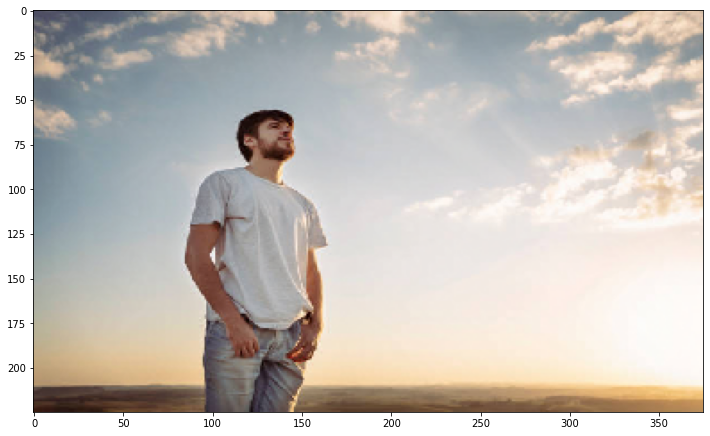

Epoch 0, loss 0.5850454568862915


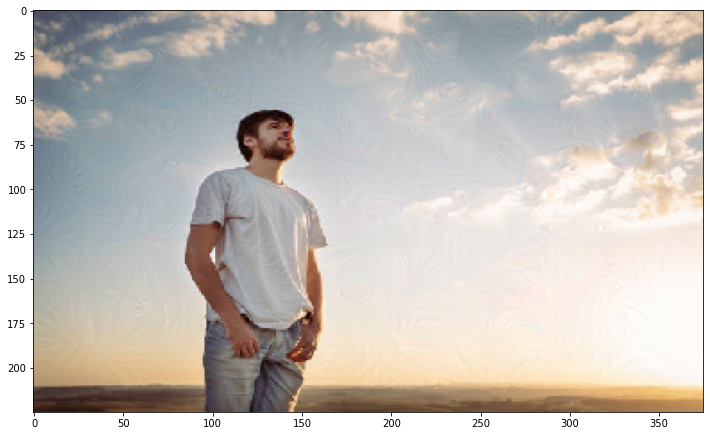

Epoch 200, loss 1.0084069967269897


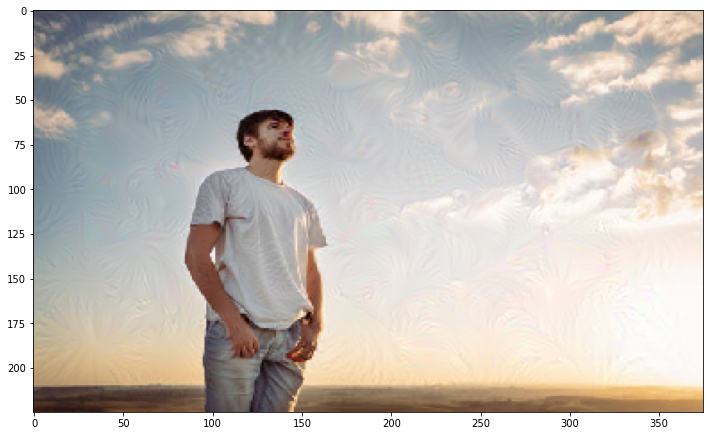

Epoch 400, loss 1.1853505373001099


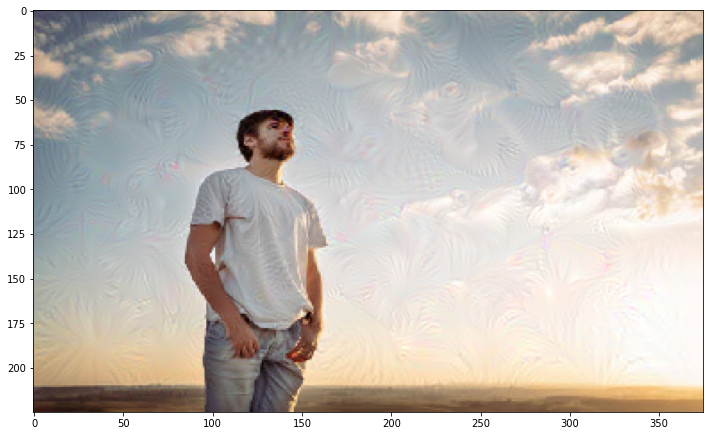

Epoch 600, loss 1.302069902420044


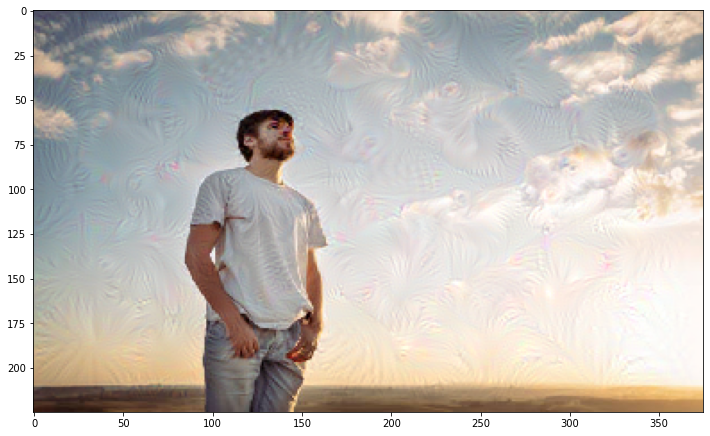

Epoch 800, loss 1.3880641460418701


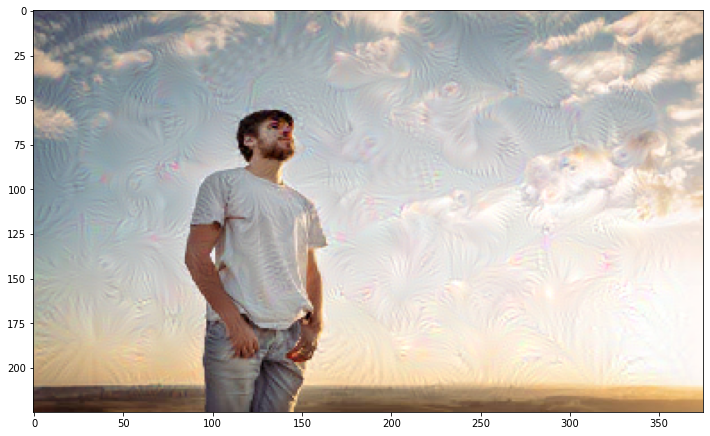

Epoch 1000, loss 1.4565610885620117


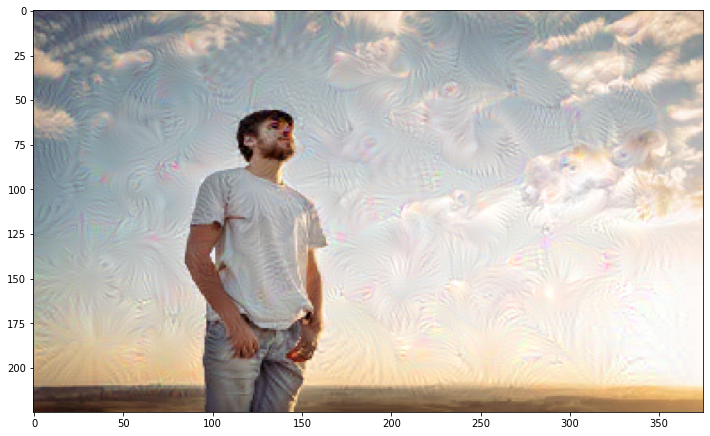

Epoch 1200, loss 1.5151567459106445


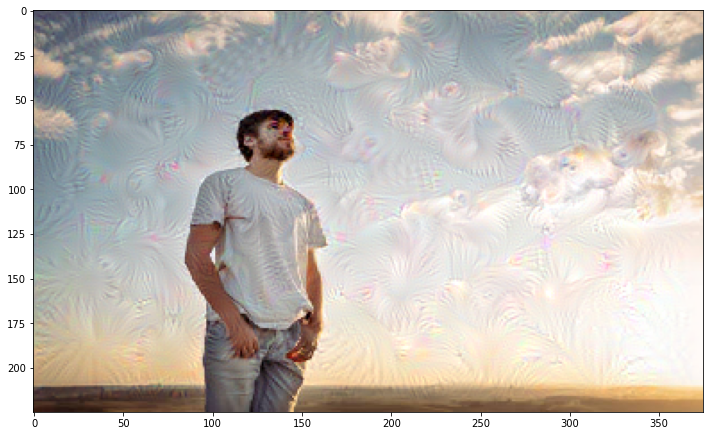

Epoch 1400, loss 1.5668888092041016


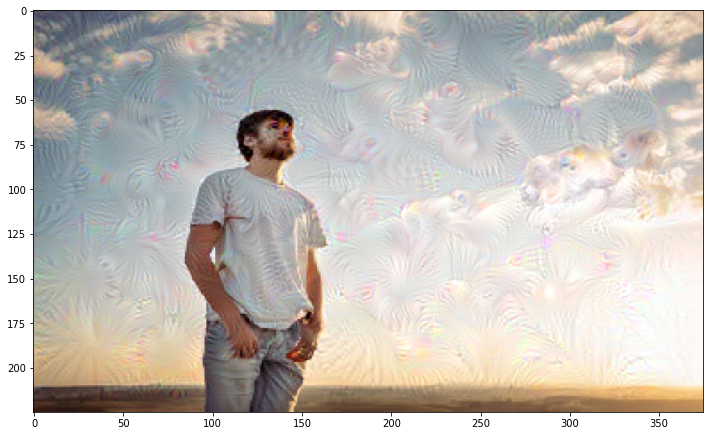

Epoch 1600, loss 1.6124873161315918


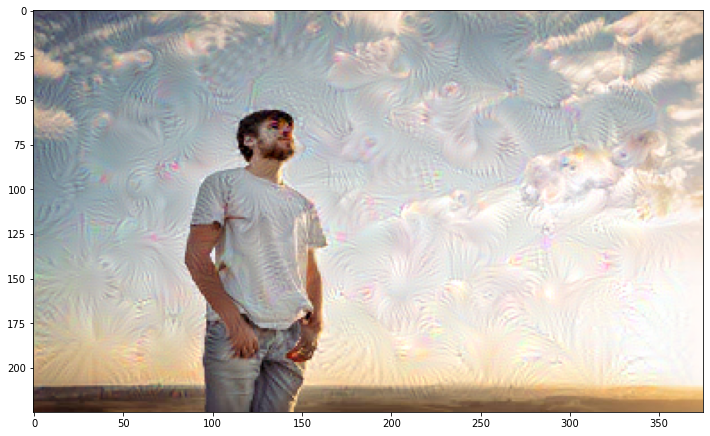

Epoch 1800, loss 1.6521656513214111


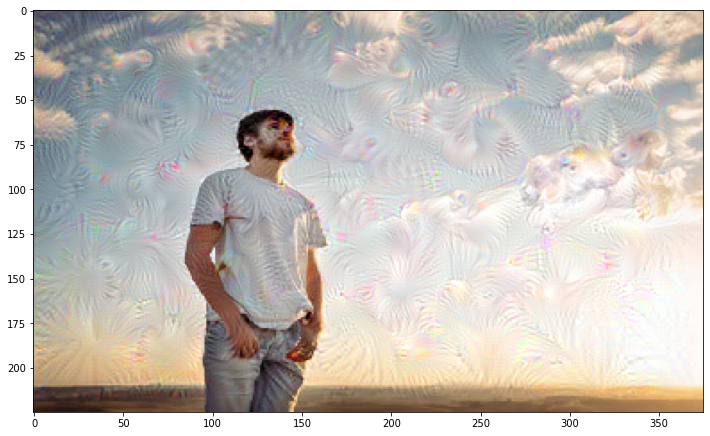

Epoch 2000, loss 1.6879212856292725


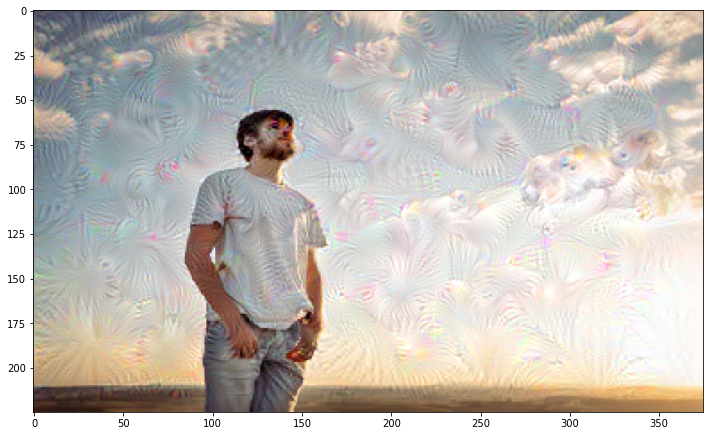

Epoch 2200, loss 1.7199008464813232


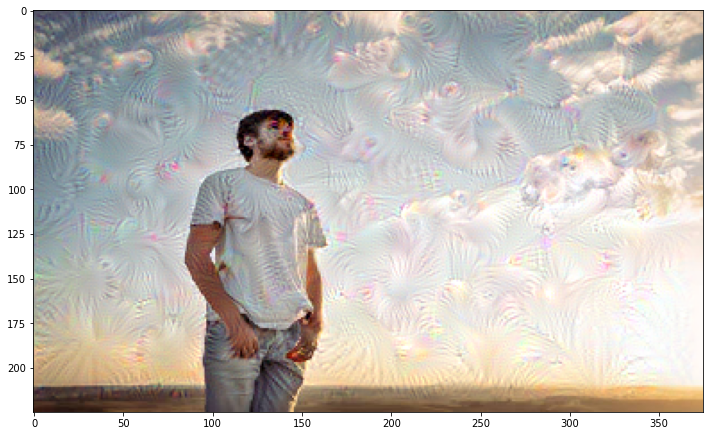

Epoch 2400, loss 1.7496488094329834


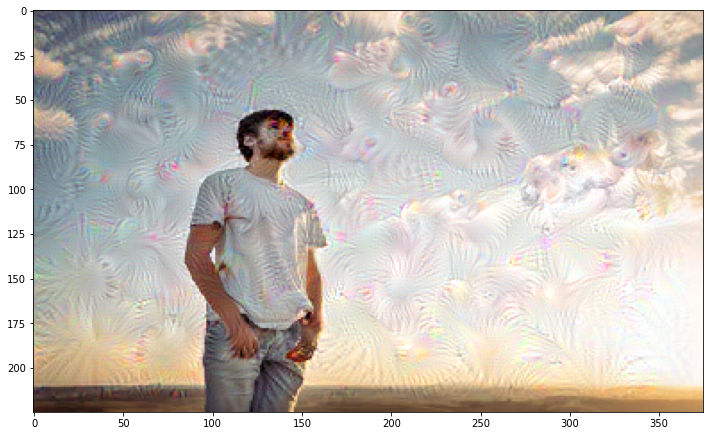

Epoch 2600, loss 1.7777643203735352


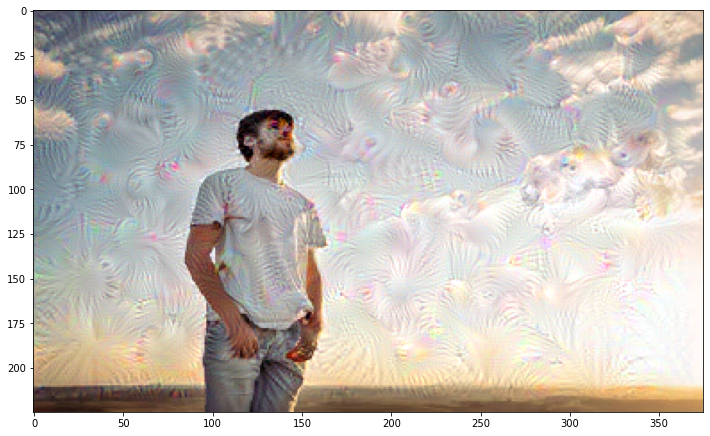

Epoch 2800, loss 1.8038376569747925


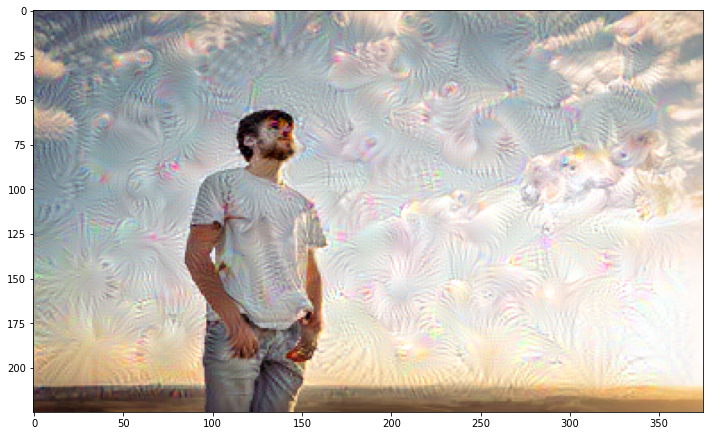

Epoch 3000, loss 1.8280091285705566


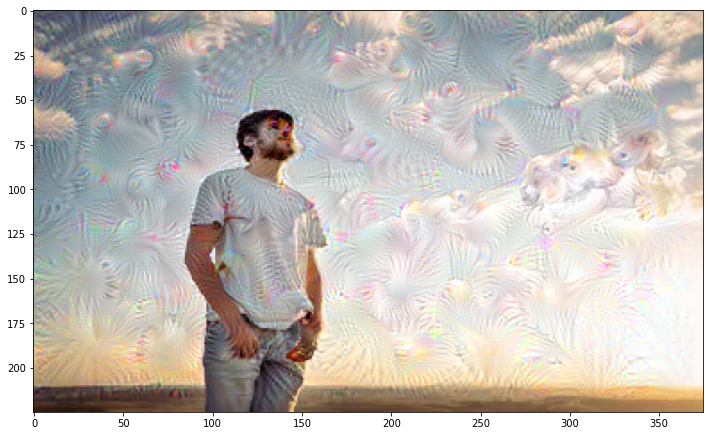

Epoch 3200, loss 1.8504068851470947


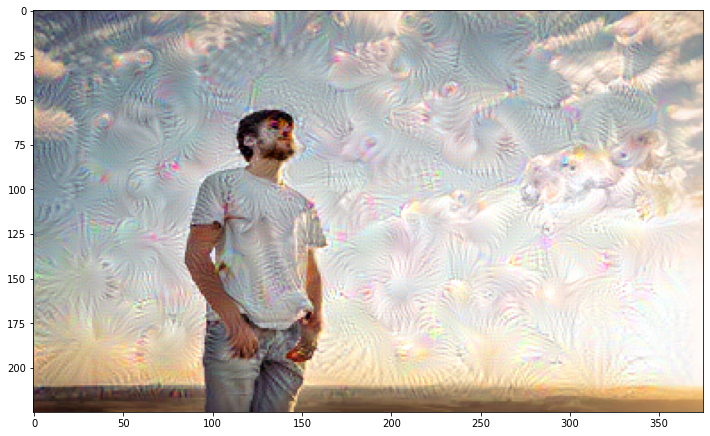

Epoch 3400, loss 1.8714040517807007


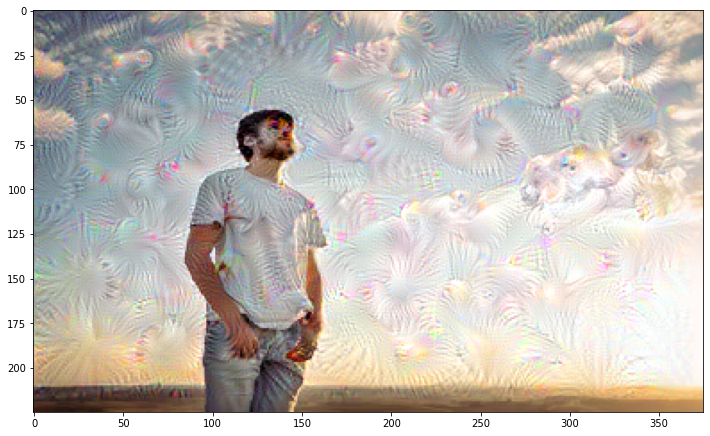

Epoch 3600, loss 1.891329288482666


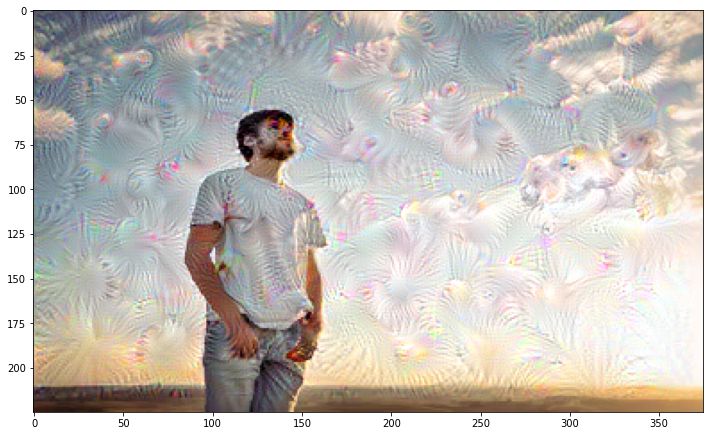

Epoch 3800, loss 1.9104304313659668


In [39]:
run_deep_dream(network=deep_dream_model, image=image, epochs = 4000, learning_rate=0.0001)